In [1]:
from __future__ import annotations

import itertools as it
from numbers import Number
from pathlib import Path

import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
import yaml
from matplotlib import cm, font_manager

from notebooks.adjacency_matrix import filter_logile
from notebooks.dataset import Atlas, Dataset
from notebooks.disruption_topology import (
    get_disruption_by_hubness,
    plot_disruption_topology,
)
from notebooks.graph_tool_utils import graph_from_weighted_matrix
from notebooks.hubness import hubness, plot_hubness_ranks
from notebooks.plotting import (
    add_colorbar,
    add_legend,
    comparison_plot,
    fig_to_numpy,
    plot_hierachical_connectome,
    plot_on_atlas,
    StatResults
)
from notebooks.topology import (
    compare_hubness_intergroup,
    compare_hubness_intragroup,
    compute_kendalltau_distances,
    plot_intragroup_difference,
    plot_permutation_result,
)
from notebooks.demographics import DemographicTable
from notebooks.utils import concat_product, symmetrize
from styles import styles as Styles

%matplotlib inline
%load_ext autoreload
%autoreload 2
plt.style.use("styles/manuscript.mplstyle")
font_dirs = [Path.home() / ".fonts"]
font_files = font_manager.findSystemFonts(fontpaths=font_dirs)

for font_file in font_files:
    font_manager.fontManager.addfont(font_file)

/cvmfs/soft.computecanada.ca/easybuild/software/2020/avx2/Compiler/gcc9/graph-tool/2.56/lib/python3.10/site-packages/graph_tool/draw/cairo_draw.py:1544: RuntimeWarning: Error importing Gtk module: No module named 'gi'; GTK+ drawing will not work.
  warnings.warn(msg, RuntimeWarning)


# Setup

In [2]:
with open("hcp_metadata.yaml") as f:
    hcp_phenotypes = yaml.safe_load(f)

with open("topsy_metadata.yaml") as f:
    topsy_phenotypes = yaml.safe_load(f)

topsy = (
    Dataset("/scratch/knavynde/topsy", "topsy")
    .add_phenotypes(topsy_phenotypes)
    # .exclude_subjects(["014", "016"])
)
topsy.metadata = topsy.metadata.xs("1", level="session_id")
hcp = Dataset("/scratch/knavynde/HCPpsych", "hcp").add_phenotypes(hcp_phenotypes)
statresults = StatResults()

In [3]:
import graph_tool.all as gt

def graphx(self):
    g = gt.Graph(directed=False)
    arr = self.masked
    arr.mask[np.triu_indices_from(arr)] = True
    edges = np.nonzero(arr.filled(0))
    g.add_vertex(self.metadata.index.shape[0])
    g.add_edge_list(np.array(edges).T)
    g.ep["weight"] = g.new_ep("double", vals=arr.filled(0)[edges])
    g.ep["distance"] = g.new_ep("double", vals=(1 / arr).filled(0)[edges])
    return g

def get_shortest_distances(g, weight):
    return gt.shortest_distance(g, weights=weight).get_2d_array(range(g.num_vertices()))


In [49]:
# import dask as da
# Gs_ = db.from_sequence(Gs)
def get_global_props(dataset):
    Gs = [
        graphx(adj)
        for adj in dataset.adj(
            desc="logsift2", scope=["prepdwi_recon", "snaketract"], session=[1, None]
        )
    ]

    # result = Gs_.map(_get_global_eff).compute()
    def global_efficiency(G):
        return 1 / np.ma.masked_equal(get_shortest_distances(G, G.ep["distance"]), 0)

    E = np.ma.empty((len(Gs), Gs[0].num_vertices(), Gs[0].num_vertices()))
    for i, G in enumerate(Gs):
        E[i] = global_efficiency(G)
    D = np.ma.empty((len(Gs), Gs[0].num_vertices()))
    for i, G in enumerate(Gs):
        D[i] = G.degree_property_map("total", G.ep["weight"]).a

    # with mp.Pool(16) as pool:
    #     pool.map(_get_global_eff, range(len(Gs)))

    return (
        pd.DataFrame(
            {
                "global_eff": np.mean(np.reshape(E, (E.shape[0], -1)), axis=-1),
                "degree": np.mean(np.reshape(D, (D.shape[0], -1)), axis=-1),
                "participant_id": [
                    path.get_entities()["subject"]
                    for path in dataset.get(
                        suffix="connectome",
                        desc="logsift2",
                        session=[1, None],
                        scope=["prepdwi_recon", "snaketract"],
                    )
                ],
            }
        )
        .set_index("participant_id")
        .join(dataset.metadata)
    )

topsy_global = get_global_props(topsy)
hcp_global = get_global_props(hcp)

In [5]:
def get_conmat(group, weight, dataset, scope="snaketract", log10=False):
    adjs = []
    for adj in dataset[lambda df: df["group"] == group].adj(
        desc=weight, session=["1", None], scope=scope
    ):
        proc = adj.mask_where(filter_logile(0)).sort_values(["Lobe", "hemisphere"])
        if log10:
            proc = proc.update(np.ma.log10(adj.raw))
        adjs.append(proc)

    conmat = np.ma.empty((*adjs[0].masked.shape, len(adjs)))
    part_ids = np.empty((len(adjs),), dtype="U10")
    for i, adj in enumerate(adjs):
        part_ids[i] = adj.attrs["subject"]
        conmat[..., i] = adj.masked
    return xr.DataArray(
        conmat,
        dims=("src", "dest", "participant_id"),
        coords={"participant_id": part_ids},
    ).expand_dims({"weight": [weight]})
    # if get_ids:
    #     return conmat, part_ids
    # return conmat


topsy_conmats = (
    xr.Dataset(
        {
            "adj": concat_product(
                get_conmat,
                ["HC", "FEP", "chronic"],
                ["avgFA", "logsift2", "avgMD", "avgRD", "avgL1"],
                dims=["participant_id", "weight"],
                dataset=topsy,
            )
        }
    )
    .merge(topsy.metadata, join="inner")
    .rename({"participant_id": "subject"})
)

hcp_conmats = (
    xr.Dataset(
        {
            "adj": concat_product(
                get_conmat,
                ["HC", "Patient"],
                ["avgFA", "logsift2", "avgMD", "avgRD", "avgL1"],
                dims=["participant_id", "weight"],
                dataset=hcp,
                scope="prepdwi_recon",
            )
        }
    )
    .merge(hcp.metadata, join="inner")
    .rename({"participant_id": "subject"})
)

In [6]:
topsy_hub_data = (
    hubness(topsy.nodal_props())
    .rename({"participant_id": "subject", "session_id": "session", "desc": "weight"})
    .assign(
        node_uid=lambda ds: ds["Name"] + "_" + ds["hemisphere"],
        avg_hubness = lambda ds: ds["hubness"].mean(dim="subject"),
    )
    .sel(session="1")
)
topsy_hub_data = (
    topsy_hub_data
    .sel(
        subject=topsy_hub_data
        .where(
            topsy_hub_data["hubness"].pipe(np.isnan).pipe(np.invert),
            drop=True
        )
        .where(topsy_hub_data["group"] != "High risk", drop=True)
        ["subject"]
    )
    .squeeze()
)
hcp_hub_data = (
    hubness(hcp.nodal_props())
    .rename({"participant_id": "subject", "desc": "weight"})
    .assign(
        node_uid=lambda ds: ds["Name"] + "_" + ds["hemisphere"],
        avg_hubness = lambda ds: ds["hubness"].mean(dim="subject"),
    )
    .squeeze()
)


def get_labels(ds, fields, repeats):
    labels = (
        np.repeat(ds[fields].to_pandas().to_numpy(), repeats, axis=0)
        .reshape((-1, repeats, len(fields)))
    )
    template = "<br>".join(f"<b>{name}:</b> %{{customdata[{i}]}}" for i, name in enumerate(fields))
    return labels, template

In [7]:
def load_h5_nbs(file):
    with h5py.File(file, "r") as f:
        try:
            sig = f["nbs/con_mat"][:][:, :, 0]
        except IndexError:
            sig = 0
        return f["nbs/test_stat"][:] * sig


topsy_nbs = concat_product(
    lambda weight, model: xr.DataArray(
        load_h5_nbs(
            topsy.get(
                subject=None, scope="snakemodel", desc=weight, label=model, suffix="nbs"
            )[0].path
        ),
        coords={
            "src": Atlas.bn246["Label ID"],
            "dest": Atlas.bn246["Label ID"],
        },
    ).expand_dims(weight=[weight], model=[model]),
    ["avgFA"],
    ["fep", "chronic", "fep2chronic", "hc2chronic"],
    dims=["weight", "model"],
)
hcp_nbs = concat_product(
    lambda weight, model: xr.DataArray(
        load_h5_nbs(
            hcp.get(
                subject=None, scope="snakemodel", desc=weight, model=model, suffix="nbs"
            )[0].path
        ),
        coords={
            "src": Atlas.bn246["Label ID"],
            "dest": Atlas.bn246["Label ID"],
        },
    ).expand_dims(weight=[weight], model=[model]),
    ["avgFA"],
    ["patient"],
    dims=["weight", "model"],
)

# Demographics

In [8]:

table = DemographicTable(
    topsy_hub_data.sel(subject=topsy_hub_data["group"] != "High risk")
    .assign(
        Smoking_Index=lambda da: da["Smoking_Index"].where(da["smoker"] == 1, other=0),
        handedness=lambda da: da["HandednessTotal"]
        .where(lambda ds: (ds < -4) | (ds > 4), 0)
        .where(lambda ds: ds < 4, 12)
        .where(lambda ds: (ds > -4), -12)
        .to_series()
        .map({12: "R", 0: "A", -12: "L"})
        .to_xarray(),
    )
    .fillna({"antipsychotic_dur": 0, "total_defined_daily_dose": 0, "smoker": "no"})
    .drop_dims(["threshold", "node", "weight"])
    .to_dataframe(),
    "group",
    ["HC", "FEP", "chronic"],
)


def capitalize(label):
    return label.replace("_", " ").capitalize()


table.add_nominal("sex", "{M}/{F}", autoformatter=capitalize)
table.add_scale("age", autoformatter=capitalize)
table.add_nominal("handedness", "{R}/{L}/{A}", autoformatter=capitalize)
table.add_scale("education", autoformatter=capitalize)
table.add_scale("SES")
table.add_scale("CAST")
table.add_scale("AUDIT-C")
table.add_nominal("smoker", "{yes}/{no}", autoformatter=capitalize)
table.add_nominal("Cannabis", "{yes}/{no}", autoformatter=capitalize)
table.add_scale("DUP", "DUP (weeks)", report="median", skip_stats=True)
table.add_scale("DUI", "DUI (weeks)", report="median", skip_stats=True)
table.add_scale("antipsychotic_dur", "Antipsychotic Duration (days)", skip_stats=True)
table.add_scale(
    "total_defined_daily_dose",
    "Antipsychotic Defined Daily Dose Equivalents",
    skip_stats=True,
)
table.add_scale("SOFAS")
table.add_scale("PANSSTOTAL", "PANSS-8 Total")
table.add_scale("PANSS8-P", "PANSS-8 Positive")
table.add_scale("PANSS8-N", "PANSS-8 Negative")
table.add_scale("PANSS8-G", "PANSS-8 General")
print(table.to_pandas().to_markdown())

|                                              | HC (n=37)    | FEP (n=61)      | chronic (n=15)   | HC vs FEP                        | HC vs chronic                    | FEP vs chronic                   |
|:---------------------------------------------|:-------------|:----------------|:-----------------|:---------------------------------|:---------------------------------|:---------------------------------|
| Sex (M/F)                                    | 24/13        | 50/11           | 12/3             | χ²(1) = 2.78, _p_ = 0.096        | χ²(1) = 0.547, _p_ = 0.46        | χ²(1) = 0, _p_ = 1               |
| Age                                          | 21.70 (3.49) | 22.82 (4.65)    | 28.93 (7.92)     | _t_(96) = -1.26, _p_ = 0.21      | _t_(49) = -4.55, **_p_ < 0.001** | _t_(73) = -3.83, **_p_ < 0.001** |
| Handedness (R/L/A)                           | 34/0/3       | 53/1/7          | 13/1/1           | χ²(2) = 0.928, _p_ = 0.63        | χ²(2) = 2.53, _p_ = 0.28         | χ²(2)

In [9]:
table = DemographicTable(
    hcp_hub_data.assign(
        pack_years=hcp_hub_data["smoke_time"] * hcp_hub_data["smoke_amount"] / 20
    )
    .fillna({"antipsychotic_dur": 0, "total_defined_daily_dose": 0})
    .drop_dims(["node", "weight"])
    .to_dataframe(),
    "group",
)


def capitalize(label):
    return label.replace("_", " ").capitalize()


table.add_nominal("sex", "{M}/{F}", autoformatter=capitalize)
table.add_scale("education", autoformatter=capitalize)
table.add_scale("age", autoformatter=capitalize)
table.add_nominal("handedness", "{R}/{L}", autoformatter=capitalize)
table.add_scale("SES")
table.add_nominal("smoke", "{Yes}/{No}", autoformatter=capitalize)
table.add_scale("pack_years", autoformatter=capitalize)
table.add_scale("cannabis_exposure", "Cannabis", skip_stats=True)
table.add_scale("antipsychotic_dur", "Antipsychotic Duration (months)", skip_stats=True)
table.add_scale(
    "total_defined_daily_dose",
    "Antipsychotic Defined Daily Dose Equivalents",
    skip_stats=True,
)
table.add_scale("panss-total", "PANSS Total", skip_stats=True)
table.add_scale("PANSS-P", "PANSS Positive", skip_stats=True)
table.add_scale("PANSS-N", "PANSS Negative", skip_stats=True)
table.add_scale("PANSS-G", "PANSS Global", skip_stats=True)

# Not sufficient data to report alcohol
print(table.to_pandas().to_markdown())

|                                              | HC (n=56)    | Patient (n=111)   | HC vs Patient                    |
|:---------------------------------------------|:-------------|:------------------|:---------------------------------|
| Sex (M/F)                                    | 37/19        | 68/43             | χ²(1) = 0.192, _p_ = 0.66        |
| Education                                    | 15.88 (1.92) | 14.21 (2.20)      | _t_(73) = 3.23, **_p_ = 0.0019** |
| Age                                          | 24.90 (4.08) | 22.73 (3.59)      | _t_(165) = 3.51, **_p_ < 0.001** |
| Handedness (R/L)                             | 43/10        | 99/7              | χ²(1) = 4.36, **_p_ = 0.037**    |
| SES                                          | 2.07 (1.07)  | 2.25 (1.19)       | _t_(163) = -0.955, _p_ = 0.34    |
| Smoke (Yes/No)                               | 3/51         | 20/89             | χ²(1) = 3.88, **_p_ = 0.049**    |
| Pack years                                   |

In [10]:
table = DemographicTable(
    topsy_hub_data.sel(
        subject=(
            topsy_hub_data.where(topsy_hub_data["group"].isin(["HC", "chronic"]))
            .where(topsy_hub_data["age"] >= 24, drop=True)
            ["group"]
            .dropna("subject")
            ["subject"]
        )
    )
    .assign(
        Smoking_Index=lambda da: da["Smoking_Index"].where(da["smoker"] == 1, other=0),
        handedness=lambda da: da["HandednessTotal"]
        .where(lambda ds: (ds < -4) | (ds > 4), 0)
        .where(lambda ds: ds < 4, 12)
        .where(lambda ds: (ds > -4), -12)
        .to_series()
        .map({12: "R", 0: "A", -12: "L"})
        .to_xarray(),
    )
    .fillna({"antipsychotic_dur": 0, "total_defined_daily_dose": 0, "smoker": "no"})
    .drop_dims(["threshold", "node", "weight"])
    .to_dataframe(),
    "group",
    ["HC", "chronic"],
)



def capitalize(label):
    return label.replace("_", " ").capitalize()


table.add_nominal("sex", "{M}/{F}", autoformatter=capitalize)
table.add_scale("age", autoformatter=capitalize)
table.add_nominal("handedness", "{R}/{L}", autoformatter=capitalize)
table.add_scale("education", autoformatter=capitalize)
table.add_scale("SES")
table.add_scale("CAST")
table.add_scale("AUDIT-C")
table.add_nominal("smoker", "{yes}/{no}", autoformatter=capitalize)
table.add_nominal("Cannabis", "{yes}/{no}", autoformatter=capitalize)
table.add_scale("SOFAS")
table.add_scale("PANSSTOTAL", "PANSS-8 Total")
table.add_scale("PANSS8-P", "PANSS-8 Positive")
table.add_scale("PANSS8-N", "PANSS-8 Negative")
table.add_scale("PANSS8-G", "PANSS-8 General")
print(table.to_pandas().to_markdown())

|                   | HC (n=8)     | chronic (n=11)   | HC vs chronic                 |
|:------------------|:-------------|:-----------------|:------------------------------|
| Sex (M/F)         | 6/2          | 9/2              | χ²(1) = 0, P = 1              |
| Age               | 26.50 (2.07) | 31.00 (7.71)     | t(17) = -1.6, P = 0.13        |
| Handedness (R/L)  | 8/0          | 10/1             | χ²(1) = 0, P = 1              |
| Education         | 15.50 (2.14) | 12.55 (2.42)     | t(17) = 2.75, **P = 0.014**   |
| SES               | 3.75 (1.04)  | 3.55 (1.29)      | t(17) = 0.369, P = 0.72       |
| CAST              | 6.00 (0.00)  | 9.40 (5.82)      | t(16) = -1.64, P = 0.12       |
| AUDIT-C           | 3.00 (1.60)  | 3.30 (2.58)      | t(16) = -0.286, P = 0.78      |
| Smoker (yes/no)   | 0/8          | 5/6              | χ²(1) = 2.87, P = 0.09        |
| Cannabis (yes/no) | 4/4          | 3/7              | χ²(1) = 0.143, P = 0.71       |
| SOFAS             | 82.20 (2.5

/scratch/knavynde/topsy/code/prepdwi-recon/notebooks/demographics.py:172: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  test = scs.ttest_ind(vals1, vals2, nan_policy="omit")
/scratch/knavynde/topsy/code/prepdwi-recon/notebooks/demographics.py:172: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  test = scs.ttest_ind(vals1, vals2, nan_policy="omit")
/scratch/knavynde/topsy/code/prepdwi-recon/notebooks/demographics.py:172: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  test = scs.ttest_ind(vals1, vals2, nan_policy="omit")
/scratch/knavynde/topsy/code/prepdwi-recon/notebooks/demographics.py:172: RuntimeWarning: Precisi

# Figures

## Voxelwise

In [34]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

topsy_meanFA = topsy_conmats.sel(weight="avgFA").mean(["src", "dest"]).to_dataframe()
hcp_meanFA = hcp_conmats.sel(weight="avgFA").mean(["src", "dest"]).to_dataframe()

adj_lm = ols('adj ~ C(phenotype)', data=topsy_meanFA).fit()

statresults.add_f("voxelwise_fa_topsy", adj_lm)

# sm.stats.anova_lm(adj_lm, typ=2)
print(adj_lm.summary())
res = pairwise_tukeyhsd(endog=topsy_meanFA["adj"], groups=topsy_meanFA["phenotype"], alpha=0.05)
statresults.add_p("voxelwise_fa_hc_chronic", res.pvalues[2], adj=True)
statresults.add_p("voxelwise_fa_fep_chronic", res.pvalues[1], adj=True, precision=3)
res.summary()

                            OLS Regression Results                            
Dep. Variable:                    adj   R-squared:                       0.075
Model:                            OLS   Adj. R-squared:                  0.058
Method:                 Least Squares   F-statistic:                     4.443
Date:                Mon, 23 Oct 2023   Prob (F-statistic):             0.0139
Time:                        17:18:57   Log-Likelihood:                 313.64
No. Observations:                 113   AIC:                            -621.3
Df Residuals:                     110   BIC:                            -613.1
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

group1,group2,meandiff,p-adj,lower,upper,reject
FEP,HC,0.0035,0.5235,-0.0041,0.011,False
FEP,chronic,-0.0105,0.0504,-0.0209,0.0,False
HC,chronic,-0.0139,0.01,-0.025,-0.0028,True


In [11]:
from nilearn import plotting

bkg = topsy.get(
    scope="templategen",
    subject=None,
    suffix="FA",
    extension=".nii.gz",
)[0].path

from bids import BIDSLayout, BIDSLayoutIndexer

# reindex to grab files in sourcedata
skeletonized = (
    BIDSLayout(
        Path(topsy.layout.derivatives["snakemodel"].root),
        indexer=BIDSLayoutIndexer(ignore=[".git", ".snakemake"]),
        validate=False,
        is_derivative=True,
    )
    .get(desc="skeletonized")[0]
    .path
)
display = plotting.plot_stat_map(
    skeletonized,
    bkg,
    cmap="YlGn",
    colorbar=False,
    display_mode="z",
    cut_coords=[-5, -2, 6, 16],
    # title="FEP vs Chronic",
)
display.add_overlay(
    topsy.get(
        scope="snakemodel",
        subject=None,
        model="tbss",
        desc="FA",
        label="fep2chronic",
        suffix="filled",
    )[0].path,
    cmap="hot",
)
display.close()
fep2chronic_tbss = fig_to_numpy(display.frame_axes.figure)
display = plotting.plot_stat_map(
    skeletonized,
    bkg,
    cmap="YlGn",
    colorbar=False,
    display_mode="z",
    cut_coords=(-4, 0, 4, 12),
    draw_cross=False,
    # title="FEP vs Chronic",
)
display.add_overlay(
    topsy.get(
        scope="snakemodel",
        subject=None,
        model="tbss",
        desc="FA",
        label="chronic",
        suffix="filled",
    )[0].path,
    cmap="hot",
)
display.close()
chronic_tbss = fig_to_numpy(display.frame_axes.figure)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

HC vs. chronic: Custom statistical test, P_val:1.001e-02


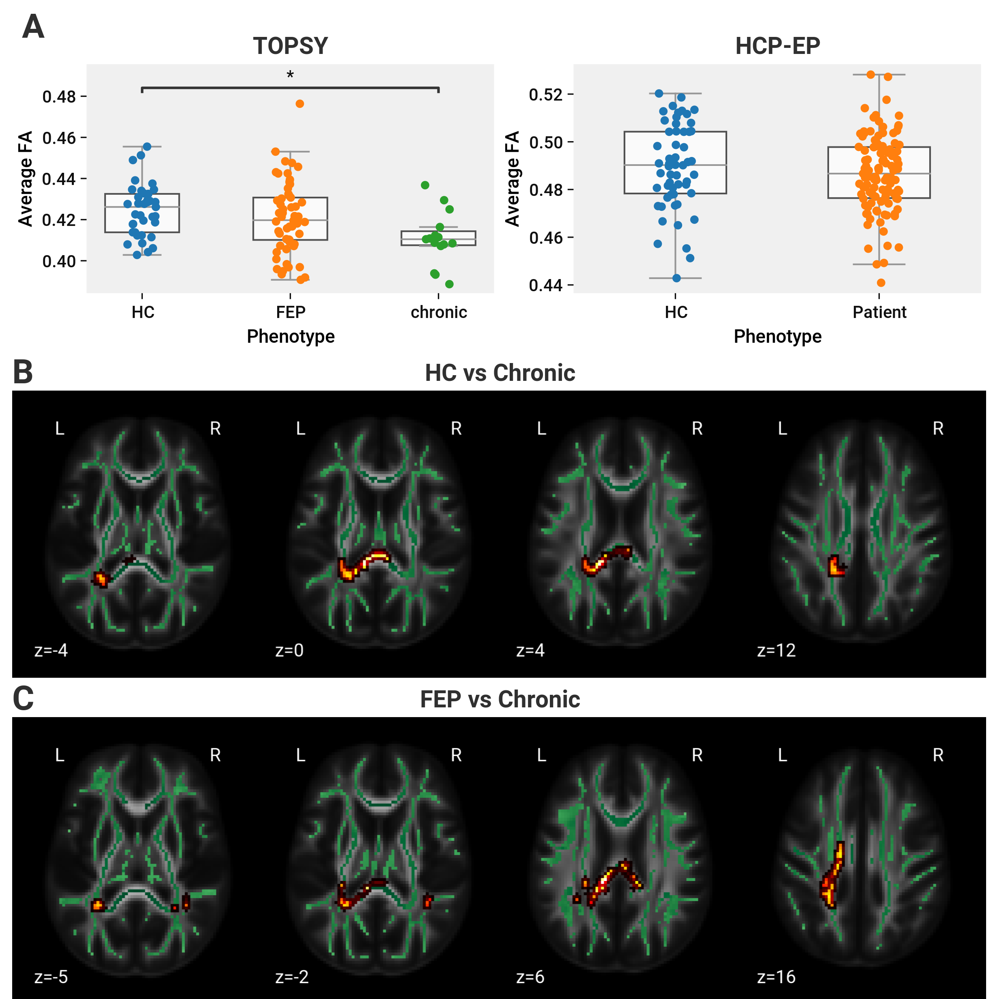

In [54]:
fig = plt.figure(figsize=(8, 8), layout="constrained")
grid = fig.add_gridspec(3, 1)

# Panel A

panel_a = fig.add_subfigure(grid[0])
panel_a.text(0.01, 0.98, "A", **Styles.panel_label)
axs = panel_a.subplots(1, 2)
order = ["HC", "FEP", "chronic"]
ax = comparison_plot(
    topsy_meanFA,
    order=order,
    ax=axs[0],
    significance={("HC", "chronic"): res.pvalues[2]},
)
ax.set_title("TOPSY", **Styles.col_title)

order = ["HC", "Patient"]
ax = comparison_plot(hcp_meanFA, order=order, ax=axs[1])
ax.set_title("HCP-EP", **Styles.col_title, size=14)


# Panel B
panel_b = fig.add_subfigure(grid[1])
panel_b.text(0, 1, "B", verticalalignment="top", **Styles.panel_label)
panel_b.suptitle("HC vs Chronic", **Styles.subfig_title)
div = panel_b.subfigures(1, 1)
div.set_facecolor("k")
ax = div.add_subplot(111)
# panel_b.set_facecolor("k")
ax.imshow(chronic_tbss)
ax.axis("off")

# Panel C
panel_c = fig.add_subfigure(grid[2])
panel_c.text(
    0, 1, "C",  verticalalignment="top", **Styles.panel_label
)
panel_c.suptitle("FEP vs Chronic", **Styles.subfig_title)
div = panel_c.subfigures(1, 1)
div.set_facecolor("k")
ax = div.add_subplot(111)
# panel_c.set_facecolor('k')
ax.imshow(fep2chronic_tbss)
ax.axis("off")
ax.set_facecolor("k")

We defined a composite hubness score using 4 individual measures of hubness: degree, betweenness, clustering coefficient, and shortest path length. Each node in each individual subject was rank-ordered with respect to each of the four metrics and assigned a score between 0 and 1 corresponding to the rank. These scores were summed together to get a hubness score between 0 and 4. Rank-ordering the nodes of each subject by hubness score gives the hubness rank for each subject. The hubness ranking varied little across the subjects (figure TBD).


The hubness scores from each subject were averaged to get the group hubness scores for each node. The group-wise hubness rankings are compared below.

Note that if, instead of the subject-wise analysis described above, the subject connectomes are first combined into group-consensus connectivity matrices, a large amount of difference manifests between groups, especially when FA is used as the weight (figure TBD)

## Connectivity

In [51]:
def get_deg_maps(nbs):
    g = gt.Graph(directed=False)
    g.add_vertex(nbs.shape[0])
    g.add_edge_list(np.array(np.nonzero(nbs)).T)
    return g.degree_property_map("total").a


deg_maps = [
    get_deg_maps(topsy_nbs.sel(model=model, weight="avgFA"))
    for model in ["chronic", "fep2chronic"]
] + [get_deg_maps(hcp_nbs.sel(model="patient", weight="avgFA"))]
vmaxes = [np.max(deg_map) for deg_map in deg_maps]
deg_ims = [
    plot_on_atlas(deg_map, transparent=True, vmax=vmax)
    for deg_map, vmax in zip(deg_maps, vmaxes)
]

In [52]:
disruption_by_hubness = pd.concat(
    [
        get_disruption_by_hubness(
            hubness=topsy_hub_data
            .sel(weight="logsift2", threshold=0)
            .groupby('group')["HC"]["hubness"]
            .mean('subject'),
            nbs=symmetrize(topsy_nbs.sel(model=model, weight='avgFA')),
            upper=0.90,
            lower=0.1,
            res=0.02,
            kernel=0.05,
            seed=2,
            normalize=False
        ).assign(model=model)
        for model in ['chronic', 'fep2chronic']
    ] +
    [
        get_disruption_by_hubness(
            hubness=hcp_hub_data
            .sel(weight="sift2")
            .groupby('group')["HC"]["hubness"]
            .mean('subject'),
            nbs=symmetrize(hcp_nbs.sel(model="patient", weight='avgFA')),
            upper=0.90,
            lower=0.1,
            res=0.02,
            kernel=0.05,
            seed=2,
            normalize=False
        ).assign(model="patient")
    ]
)

In [56]:

def _encode(feature):
    series = pd.Series(feature)
    return series.map(dict(map(reversed, enumerate(series.unique()))))

_encode(Atlas.bn246["Lobe"]).unique()

array([0, 1, 2, 3, 4, 5, 6])

In [90]:
topsy_conmats.sel(weight="logsift2")

<xarray.Dataset>
Dimensions:                   (subject: 113, src: 246, dest: 246)
Coordinates:
    weight                    <U8 'logsift2'
  * subject                   (subject) object '001' '002' '003' ... '147' '160'
Dimensions without coordinates: src, dest
Data variables: (12/25)
    adj                       (src, dest, subject) float64 nan nan ... nan nan
    species                   (subject) object 'homo sapiens' ... 'homo sapiens'
    phenotype                 (subject) object 'HC' 'HC' ... 'chronic' 'chronic'
    sex                       (subject) object 'M' 'M' 'M' 'F' ... 'F' 'M' 'M'
    DOB                       (subject) object '1990-12-20' ... '1993-09-11'
    ethnicity                 (subject) object 'White' 'White' ... nan 'White'
    ...                        ...
    antipsychotic_dur         (subject) int64 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0
    total_defined_daily_dose  (subject) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    PANSSTOTAL                (subject) float64 8.0 8.0 8.0 ... 23.0 15.0 8.0
    PANSS8-N                  (subject) float64 3.0 3.0 3.0 3.0 ... 3.0 4.0 3.0
    PANSS8-P                  (subject) float64 3.0 3.0 3.0 3.0 ... 12.0 8.0 3.0
    PANSS8-G                  (subject) float64 2.0 2.0 2.0 2.0 ... 8.0 3.0 2.0

In [88]:
np.sum(topsy_nbs.sel(model="fep2chronic") > 0)

<xarray.DataArray ()>
array(669)
Coordinates:
    model    <U11 'fep2chronic'

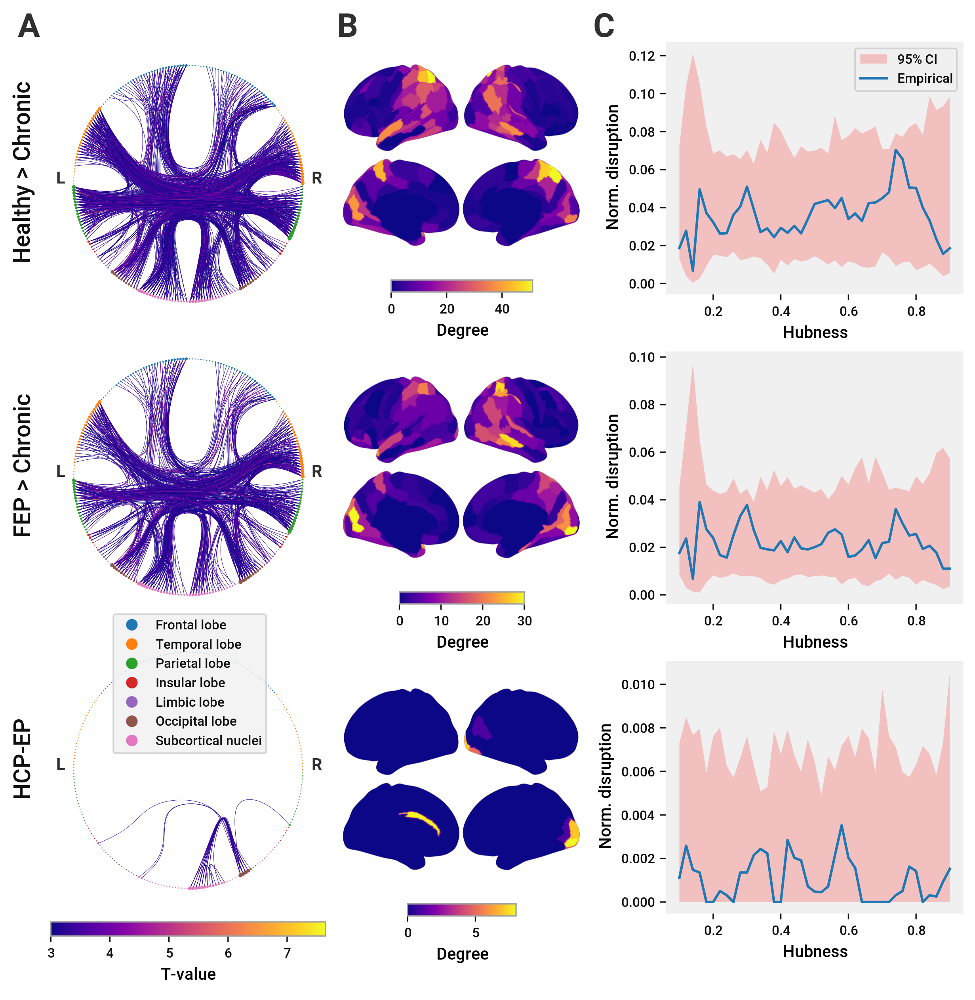

In [76]:
plt.switch_backend("cairo")
fig = plt.figure(layout="constrained", figsize=(8, 8))
grid = fig.add_gridspec(1, 3, width_ratios=[2.5, 2, 3])

panel_a = fig.add_subfigure(grid[0])
panel_a.text(0, 1, "A", **Styles.panel_label)
axs_a = panel_a.subplots(4, 1, height_ratios=[1, 1, 1, 0.05])
max_t = np.max([np.max(hcp_nbs), np.max(topsy_nbs)])

for ax, nbs, model, title in zip(
    axs_a[:-1],
    [topsy_nbs, topsy_nbs, hcp_nbs],
    ["chronic", "fep2chronic", "patient"],
    ["Healthy > Chronic", "FEP > Chronic", "HCP-EP"],
):
    arr = nbs.sel(model=model, weight="avgFA").to_masked_array().filled(0)
    plot_hierachical_connectome(
        arr, ax=ax, ecmap=cm.plasma, vcmap=cm.tab10, atlas=Atlas.bn246, emax=max_t
    )
    ax.set_title(title, rotation="vertical", x=-0.1, y=0.5, va="center")
    ax.axis("off")


cbar = axs_a[-1]
# fig.colorbar(cm.ScalarMappable(Normalize(3, max_t), cmap["plasma"]), orientation="vertical", cax=cbar).set_label('T-value')
add_colorbar(3, max_t, "plasma", cax=cbar, orientation="horizontal").set_label(
    "T-value", fontsize=10
)
cbar.yaxis.set_visible(False)
cbar.xaxis.set_tick_params(labelsize=8)

add_legend(
    panel_a,
    labels=Atlas.bn246["Lobe"].unique(),
    cmap=cm.tab10,
    prop={"size": 8},
    bbox_to_anchor=(0.55, 0.24),
    loc="lower center",
)


panel_b = fig.add_subfigure(grid[1])
panel_b.text(0, 1, "B", **Styles.panel_label)
# panel_b.set_facecolor("#f0f0f0")
cols = panel_b.subfigures(4, 1, height_ratios=[1, 1, 1, 0.05])
for deg_im, vmax, col in zip(deg_ims, vmaxes, cols):
    col_grid = col.add_gridspec(
        2, 3, width_ratios=[0.1, 1, 0.1], height_ratios=[0.95, 0.05]
    )
    cbar = col.add_subplot(col_grid[1, 1])
    ax = col.add_subplot(col_grid[0, :])
    ax.imshow(deg_im)
    add_colorbar(0, vmax, "plasma", cax=cbar, orientation="horizontal").set_label(
        "Degree", **Styles.colorbar_label
    )
    cbar.xaxis.set_tick_params(labelsize=8)
    ax.axis("off")

panel_c = fig.add_subfigure(grid[2])
panel_c.text(0, 1, "C", **Styles.panel_label)
axs_c = panel_c.subplots(4, 1, height_ratios=[1, 1, 1, 0.05])
axs_c[-1].axis("off")


for ax, model in zip(
    axs_c,
    ["chronic", "fep2chronic", "patient"],
):
    d = disruption_by_hubness[disruption_by_hubness["model"] == model]
    plot_disruption_topology(d, ax, legend=model == "chronic")

## Topology

In [36]:
data = topsy_hub_data.sel(weight="logsift2", threshold=0).groupby("group")

kt_topsy = compute_kendalltau_distances(
    topsy_hub_data.sel(
        weight="logsift2", threshold=0, subject=topsy_hub_data["group"] != "High risk"
    )["hubness"]
)

hc_to_fep = compare_hubness_intragroup(
    data["HC"]["subject"], data["FEP"]["subject"], kt_topsy
)
hc_to_chronic = compare_hubness_intragroup(
    data["HC"]["subject"], data["chronic"]["subject"], kt_topsy
)
fep_to_chronic = compare_hubness_intragroup(
    data["FEP"]["subject"], data["chronic"]["subject"], kt_topsy
)

# HCP
data = hcp_hub_data.sel(weight="logsift2").groupby("group")

kt_hcp = compute_kendalltau_distances(hcp_hub_data.sel(weight="logsift2")["hubness"])

hcp_patient_to_hc = compare_hubness_intragroup(
    data["HC"]["subject"], data["Patient"]["subject"], kt_hcp
)

In [37]:
imgs = [
    np.asarray(
        plot_on_atlas(
            topsy_hub_data.sel(weight="logsift2", threshold=0)
            .groupby("group")["HC"]["hubness"]
            .mean("subject"),
            vmax=1,
            transparent=True,
        )
    ),
    np.asarray(
        plot_on_atlas(
            hcp_hub_data.sel(weight="logsift2")
            .groupby("group")["HC"]["hubness"]
            .mean("subject"),
            vmax=1,
            transparent=True,
        )
    ),
]

In [40]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

topsy_global_ = topsy_global[topsy_global["phenotype"] != "CHR"]

topsy_lm_degree = ols("degree ~ C(phenotype)", data=topsy_global_).fit()
hcp_lm_degree = ols("degree ~ C(phenotype)", data=hcp_global).fit()
topsy_lm_eff = ols("global_eff ~ C(phenotype)", data=topsy_global_).fit()
hcp_lm_eff = ols("global_eff ~ C(phenotype)", data=hcp_global).fit()

# sm.stats.anova_lm(adj_lm, typ=2)

topsy_lm_degree_tukey = pairwise_tukeyhsd(
    endog=topsy_global_["degree"], groups=topsy_global_["phenotype"], alpha=0.05
)
statresults.add_f("topology_degree", topsy_lm_degree)
statresults.add_p("topology_degree_hc_chronic", topsy_lm_degree_tukey.pvalues[2])

print(topsy_lm_degree.summary())
print(hcp_lm_degree.summary())
print(topsy_lm_eff.summary())
print(hcp_lm_eff.summary())

topsy_lm_degree_tukey.summary()


                            OLS Regression Results                            
Dep. Variable:                 degree   R-squared:                       0.083
Model:                            OLS   Adj. R-squared:                  0.066
Method:                 Least Squares   F-statistic:                     4.947
Date:                Mon, 23 Oct 2023   Prob (F-statistic):            0.00876
Time:                        17:42:34   Log-Likelihood:                -484.05
No. Observations:                 113   AIC:                             974.1
Df Residuals:                     110   BIC:                             982.3
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

group1,group2,meandiff,p-adj,lower,upper,reject
FEP,HC,7.8805,0.0891,-0.9223,16.6833,False
FEP,chronic,-8.4493,0.2298,-20.6244,3.7258,False
HC,chronic,-16.3298,0.0093,-29.2607,-3.3988,True


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

HC vs. chronic: Custom statistical test, P_val:9.282e-03
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

FEP vs. chronic: Custom statistical test, P_val:3.540e-02
HC vs. chronic: Custom statistical test, P_val:1.860e-02
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

HC vs. Patient: Custom statistical test, P_val:3.420e-02


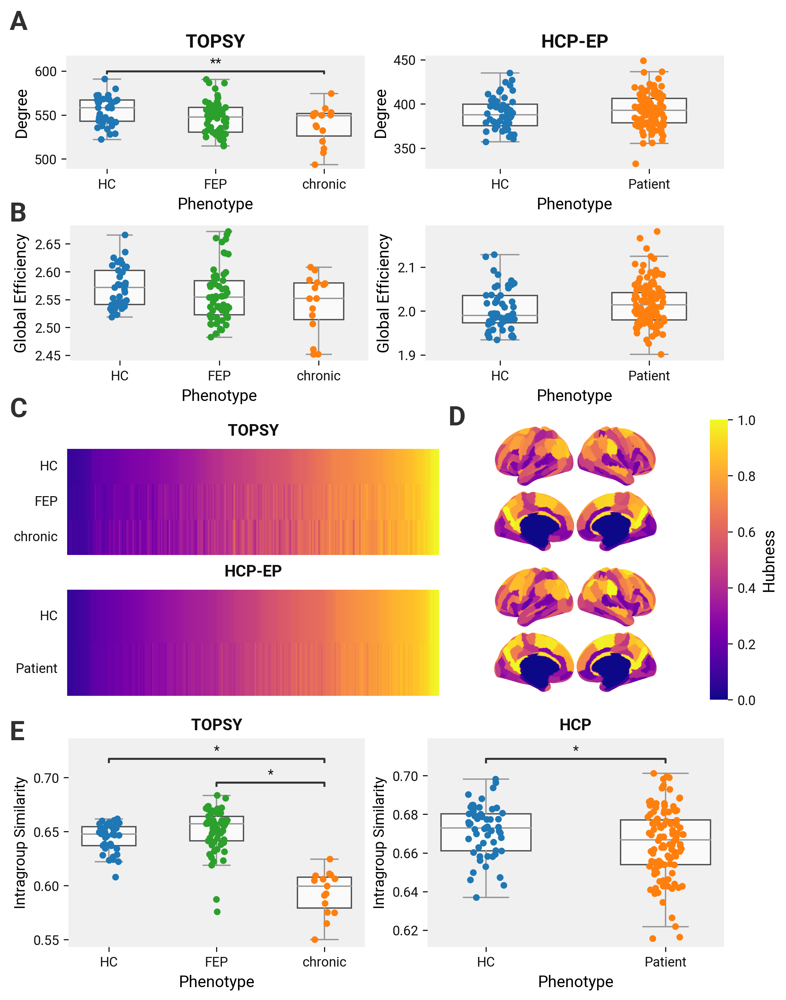

In [ ]:
# | label: hubness-ranking
# | fig-cap: |
# |   Average hubness scores across group members of brainnetome atlas nodes. Nodes are
# |   sorted according to increasing hubness in healthy controls. Scores based on number
# |   of streamlines (sift2 corrected) are shown in the left column, scores based on
# |   average FA are in the right. Nodes in disease groups
# |   are shown in the same order for comparison.


fig = plt.figure(layout="constrained", figsize=(8, 10), facecolor="white")
grid = fig.add_gridspec(
    4, 3, width_ratios=[1.7, 1, 0.07], height_ratios=[1, 1, 1.5, 1.5]
)


# panel A
panel_a = fig.add_subfigure(grid[0, :])
panel_a.text(0, 1, "A", **Styles.panel_label)

axs = panel_a.subplots(1, 2)
axs[0].set_title("TOPSY", fontdict=dict(weight="bold"))
axs[1].set_title("HCP-EP", fontdict=dict(weight="bold"))

topsy_order = ["HC", "FEP", "chronic"]
ax = comparison_plot(
    topsy_global,
    order=topsy_order,
    ax=axs[0],
    y="degree",
    ylabel="Degree",
    significance=topsy_lm_degree_tukey
)

hcp_order = ["HC", "Patient"]
comparison_plot(hcp_global, order=hcp_order, ax=axs[1], y="degree", ylabel="Degree")

# panel B
panel_b = fig.add_subfigure(grid[1, :])
panel_b.text(0, 1, "B", **Styles.panel_label)

axs = panel_b.subplots(1, 2)

ax = comparison_plot(
    topsy_global,
    order=topsy_order,
    ax=axs[0],
    y="global_eff",
    ylabel="Global Efficiency",
)

ax = comparison_plot(
    hcp_global, order=hcp_order, ax=axs[1], y="global_eff", ylabel="Global Efficiency"
)


# colorab axis
cbar_ax = fig.add_subplot(grid[2, 2])

# panel C
panel_b = fig.add_subfigure(grid[2, 0])
panel_b.text(0, 1.01, "C", **Styles.panel_label)
axs_b = panel_b.subplots(2, 1, sharey=False)
for (dataset, title, order), axes in zip(
    [
        (topsy_hub_data.sel(threshold=0), "TOPSY", ["HC", "FEP", "chronic"]),
        (hcp_hub_data, "HCP-EP", None),
    ],
    axs_b,
):
    get_ds = lambda _weight: (
        data.swap_dims({"node": "node_uid"}).groupby("group").mean().sel(weight=_weight)
    )
    ds = dataset.groupby("group").mean().sel(weight="logsift2")
    plot_hubness_ranks(
        ds, sort_col="hubness", ax=axes, cbar_ax=cbar_ax, order=order
    )
    axes.set_title(
        title,
        pad=10,
        fontdict=dict(
            fontsize=12,
            fontweight="bold",
        ),
    )


# panel D
panel_c = fig.add_subfigure(grid[2, 1])
panel_c.text(0, 0.98, "D", **Styles.panel_label)
axs = panel_c.subplots(2, 1, height_ratios=[0.4, 0.4])
axs[0].imshow(imgs[0])
axs[1].imshow(imgs[1])
# subfigs = fig.subfigures(1, 2)
# axs = subfigs[0].subplots(2, 2, subplot_kw={"projection": "3d"})
for ax in axs.flat:
    ax.get_yaxis().set_visible(False)
    ax.get_xaxis().set_visible(False)
    ax.set_facecolor("#FFFFFF")

cbar_ax.set_ylabel("Hubness")

# panel E
panel_e = fig.add_subfigure(grid[-1, :])
panel_e.text(0, 0.98, "E", verticalalignment="top", **Styles.panel_label)
axs = panel_e.subplots(1, 2)
# subfigs = fig.subfigures(1, 2)
# axs = subfigs[0].subplots(2, 2, subplot_kw={"projection": "3d"})


order = ["HC", "FEP", "chronic"]
plot_intragroup_difference(
    kt_topsy,
    topsy_hub_data.sel(
        weight="logsift2", threshold=0, subject=topsy_hub_data["group"] != "High risk"
    ),
    axs[0],
    title="TOPSY",
    order=order,
    significance={
        ("HC", "chronic"): hc_to_chronic.pvalue,
        ("FEP", "chronic"): fep_to_chronic.pvalue,
    }
)
plot_intragroup_difference(
    kt_hcp, hcp_hub_data.sel(weight="logsift2"), axs[1], title="HCP", significance={
        ("HC", "Patient"): hcp_patient_to_hc.pvalue
    }
)

statresults.add_p("topology_intragroup_similarity_hc_chronic", hc_to_chronic.pvalue)
statresults.add_p("topology_intragroup_similarity_fep_chronic", fep_to_chronic.pvalue)
statresults.add_p("topology_intragroup_similarity_hc_ep", hcp_patient_to_hc.pvalue)


# Supplemental

## HC-Chronic Age Matching

In [63]:
g = graph_from_weighted_matrix(topsy_nbs.sel(model="hc2chronic", weight="avgFA"))
deg_map = g.degree_property_map("total").a

deg_ims = [plot_on_atlas(deg_map, transparent=True, vmax=np.max(deg_map))]
vmaxes = [np.max(deg_map)]


disruption_by_hubness = get_disruption_by_hubness(
    hubness=topsy_hub_data.sel(weight="logsift2", threshold=0)
    .groupby("group")["HC"]["hubness"]
    .mean("subject"),
    nbs=symmetrize(topsy_nbs.sel(model="hc2chronic", weight="avgFA")),
    upper=0.90,
    lower=0.1,
    res=0.02,
    kernel=0.05,
    seed=2,
).assign(model="hc2chronic")


class hc2chronic_fa_lm:
    data = (
        topsy_conmats.sel(
            weight="avgFA",
            subject=(
                (topsy_conmats["age"] > 23)
                & (
                    (topsy_conmats["group"] == "HC")
                    | (topsy_conmats["group"] == "chronic")
                )
            ),
        )
        .mean(["src", "dest"])
        .to_dataframe()
    )
    lm = ols(
        "adj ~ phenotype - 1",
        data=data,
    ).fit()
    test = lm.t_test("phenotype[HC] - phenotype[chronic]")


statresults.add_t("hc-match-chronic_fa", hc2chronic_fa_lm.test)


class hc2chronic_logsift_lm:
    data = topsy_global[
        topsy_global["phenotype"].isin(["HC", "chronic"]) & (topsy_global["age"] > 23)
    ]
    lm = ols(
        "degree ~ phenotype",
        data=data,
    ).fit()
    test = lm.t_test("phenotype[T.chronic]")



p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

HC vs. chronic: Custom statistical test, P_val:3.478e-02


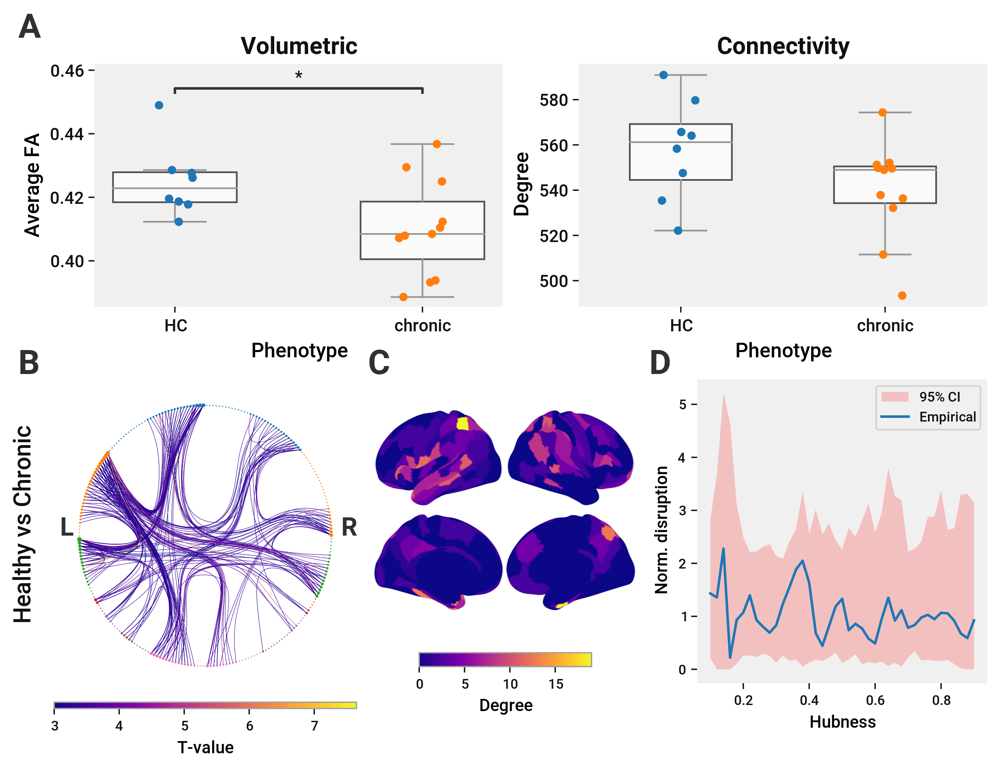

In [62]:
plt.switch_backend("cairo")
fig = plt.figure(layout="constrained", figsize=(8, 6))

subfigs = fig.subfigures(2, 1, height_ratios=[1.3, 1.5])
lower_grid = subfigs[1].add_gridspec(1, 3, width_ratios=[2.5, 2, 2.5])


# Panel A

panel_a = subfigs[0]
panel_a.text(0, 0.98, "A", **Styles.panel_label)
axs = panel_a.subplots(1, 2)
order = ["HC", "chronic"]

comparison_plot(
    hc2chronic_fa_lm.data,
    order=order,
    ax=axs[0],
    significance={("HC", "chronic"): hc2chronic_fa_lm.test.pvalue.item()},
)
axs[0].set_title("Volumetric", fontdict=dict(weight="bold"))

comparison_plot(
    hc2chronic_logsift_lm.data,
    order=order,
    ax=axs[1],
    y="degree",
    ylabel="Degree",
)
axs[1].set_title("Connectivity", fontdict=dict(weight="bold"))


# Panel B
panel_b = subfigs[1].add_subfigure(lower_grid[0])
panel_b.text(0, 1, "B", **Styles.panel_label)
axs = panel_b.subplots(2, 1, height_ratios=[1, 0.02])

max_t = np.max(topsy_nbs.sel(model="hc2chronic", weight="avgFA"))

for ax, nbs, model, title in zip(
    axs[:-1], [topsy_nbs], ["hc2chronic"], ["Healthy vs Chronic"]
):
    arr = nbs.sel(model=model, weight="avgFA")
    plot_hierachical_connectome(arr, ax=ax, atlas=Atlas.bn246, emax=max_t)
    ax.set_title(title, rotation="vertical", x=-0.1, y=0.5, va="center")
    ax.axis("off")

cbar = axs[-1]
add_colorbar(3, max_t, "plasma", cax=cbar, orientation="horizontal").set_label(
    "T-value", fontsize=10
)
cbar.yaxis.set_visible(False)
cbar.xaxis.set_tick_params(labelsize=8)


# Panel C
panel_c = subfigs[1].add_subfigure(lower_grid[1])
panel_c.text(0, 1, "C", **Styles.panel_label)
cols = panel_c.subfigures(2, 1, height_ratios=[1, 0.1])
for deg_im, vmax, col in zip(deg_ims, vmaxes, cols):
    col_grid = col.add_gridspec(
        2, 3, width_ratios=[0.1, 1, 0.1], height_ratios=[0.95, 0.05]
    )
    cbar = col.add_subplot(col_grid[1, 1])
    ax = col.add_subplot(col_grid[0, :])
    ax.imshow(deg_im)
    add_colorbar(0, vmax, "plasma", cax=cbar, orientation="horizontal").set_label(
        "Degree", fontsize=10
    )
    cbar.xaxis.set_tick_params(labelsize=8)
    
    ax.axis("off")

# Panel D
panel_d = subfigs[1].add_subfigure(lower_grid[2])
panel_d.text(0, 1, "D", **Styles.panel_label)
axs = panel_d.subplots(2, 1, height_ratios=[1, 0.05])
axs[-1].axis("off")


plot_disruption_topology(disruption_by_hubness, axs[0])

## Alternate Disruption Topology

In [27]:
def suppl_disruption_by_hubness(kernel, weight):
    return pd.concat(
        [
            get_disruption_by_hubness(
                hubness=topsy_hub_data
                .sel(weight="logsift2", threshold=0)
                .groupby('group')["HC"][weight]
                .mean('subject'),
                nbs=symmetrize(topsy_nbs.sel(model=model, weight='avgFA')),
                upper=0.90,
                lower=0.1,
                res=0.02,
                kernel=kernel,
                subgraph="open" if isinstance(kernel, Number) else "closed",
                seed=2,
                normalize=False,
            ).assign(model=model)
            for model in ['chronic', 'fep2chronic']
        ] +
        [
            get_disruption_by_hubness(
                hubness=hcp_hub_data
                .sel(weight="logsift2")
                .groupby('group')["HC"][weight]
                .mean('subject'),
                nbs=symmetrize(hcp_nbs.sel(model="patient", weight='avgFA')),
                upper=0.90,
                lower=0.1,
                res=0.02,
                kernel=kernel,
                subgraph="open" if isinstance(kernel, Number) else "closed",
                seed=2,
                normalize=False,
            ).assign(model="patient")
        ]
    )

disr_hub_sup = suppl_disruption_by_hubness("upper", "hubness")
disr_hub_sub = suppl_disruption_by_hubness("lower", "hubness")
disr_deg_kern = suppl_disruption_by_hubness(0.1, "degree_rank")
disr_deg_sup = suppl_disruption_by_hubness("upper", "degree_rank")
disr_deg_sub = suppl_disruption_by_hubness("lower", "degree_rank")

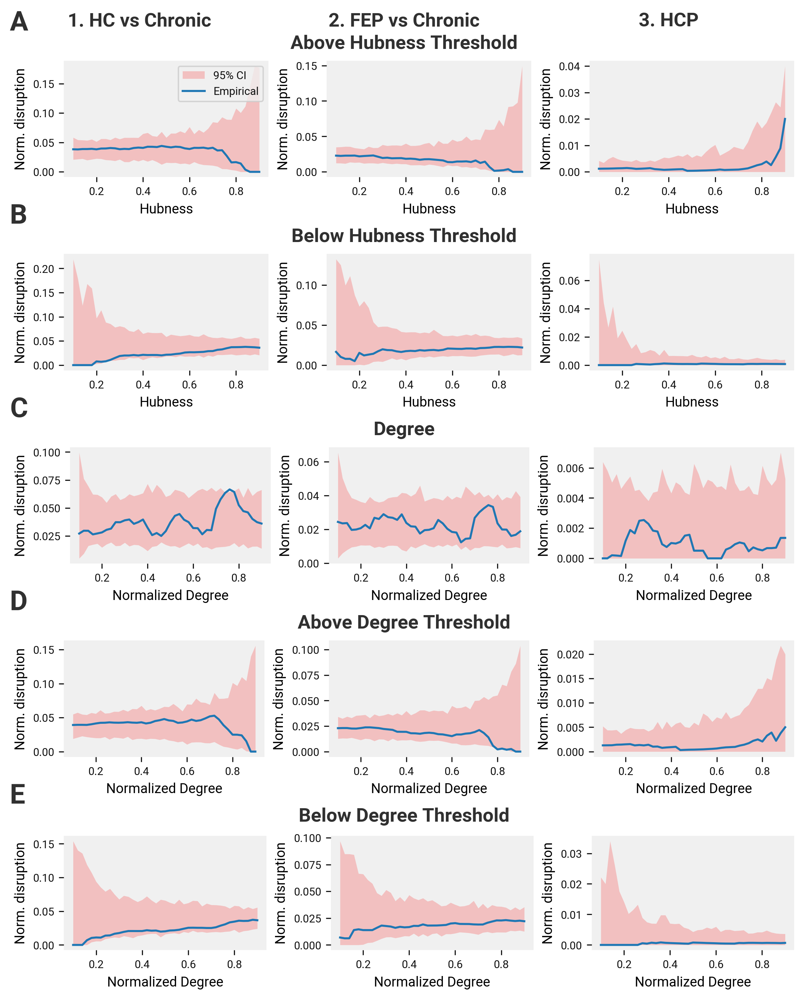

In [39]:
# order.a = np.arange(len(order.a))
# order.a[0] = 23


def iter_models(data, axs, xlabel=None, legend=False):
    for i, model in enumerate(data["model"].unique()):
        plot_disruption_topology(
            data[data["model"] == model], axs[i], xlabel=xlabel, legend=legend and not i
        )


fig = plt.figure(layout="constrained", figsize=(8, 10))
grid = fig.add_gridspec(6, 1, height_ratios=[0.1, 1, 1, 1, 1, 1])
titles = fig.add_subfigure(grid[0])
title_cols = titles.subfigures(1, 3)
title_cols[0].suptitle("1. HC vs Chronic", **Styles.col_title)
title_cols[1].suptitle("2. FEP vs Chronic", **Styles.col_title)
title_cols[2].suptitle("3. HCP", **Styles.col_title)

panel_a = fig.add_subfigure(grid[1])
panel_a.text(0, 1, "A", **Styles.panel_label)
panel_a.suptitle("Above Hubness Threshold", **Styles.subfig_title)
axs_a = panel_a.subplots(1, 3)
iter_models(disr_hub_sup, axs_a, legend=True)

panel_b = fig.add_subfigure(grid[2])
panel_b.text(0, 1, "B", **Styles.panel_label)
panel_b.suptitle("Below Hubness Threshold", **Styles.subfig_title)
axs_b = panel_b.subplots(1, 3)
iter_models(disr_hub_sub, axs_b)

panel_c = fig.add_subfigure(grid[3])
panel_c.text(0, 1, "C", **Styles.panel_label)
panel_c.suptitle("Degree", **Styles.subfig_title)
axs = panel_c.subplots(1, 3)
iter_models(disr_deg_kern, axs, xlabel="Normalized Degree")

panel_d = fig.add_subfigure(grid[4])
panel_d.text(0, 1, "D", **Styles.panel_label)
panel_d.suptitle("Above Degree Threshold", **Styles.subfig_title)
axs = panel_d.subplots(1, 3)
iter_models(disr_deg_sup, axs, xlabel="Normalized Degree")

panel_e = fig.add_subfigure(grid[5])
panel_e.text(0, 1, "E", **Styles.panel_label)
panel_e.suptitle("Below Degree Threshold", **Styles.subfig_title)
axs = panel_e.subplots(1, 3)
iter_models(disr_deg_sub, axs, xlabel="Normalized Degree")

## Other parameters

In [29]:
topsy_nbs_other_params = xr.concat(
    [
        concat_product(
            lambda weight, model: xr.DataArray(
                load_h5_nbs(
                    topsy.get(
                        subject=None,
                        scope="snakemodel",
                        desc=weight,
                        label=model,
                        suffix="nbs",
                    )[0].path
                ),
                coords={
                    "src": Atlas.bn246["Label ID"],
                    "dest": Atlas.bn246["Label ID"],
                },
            ).expand_dims(weight=[weight], model=[model]),
            ["avgMD", "avgRD", "avgAD"],
            ["fep", "chronic", "fep2chronic", "fepI", "chronicI", "chronic2fep"],
            dims=["weight", "model"],
        ),
        concat_product(
            lambda weight, model: xr.DataArray(
                load_h5_nbs(
                    topsy.get(
                        subject=None,
                        scope="snakemodel",
                        desc=weight,
                        label=model,
                        suffix="nbs",
                    )[0].path
                ),
                coords={
                    "src": Atlas.bn246["Label ID"],
                    "dest": Atlas.bn246["Label ID"],
                },
            ).expand_dims(weight=[weight], model=[model]),
            ["avgFA"],
            ["panssg", "panssn", "pansst", "panssp"],
            dims=["weight", "model"],
        ),
    ],
    dim="model"
)

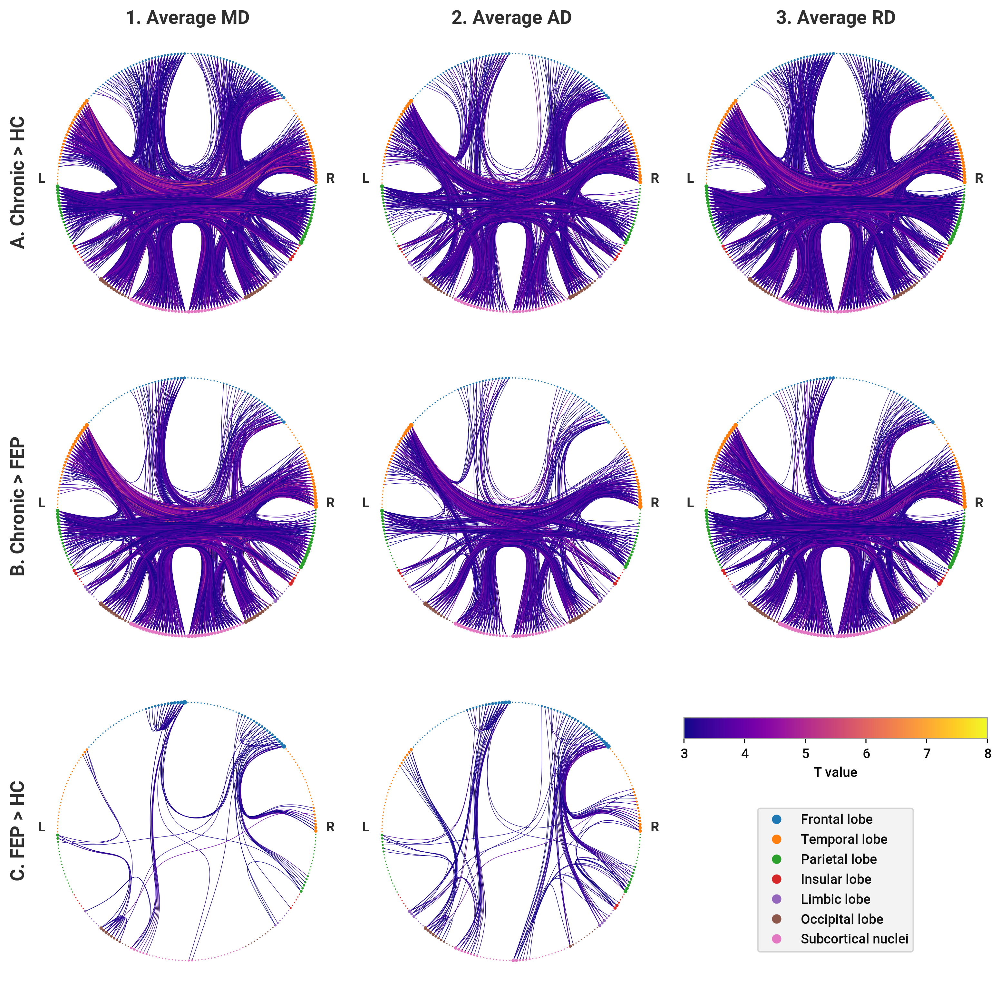

In [77]:
plt.switch_backend("cairo")
fig = plt.figure(layout="constrained", figsize=(10, 10), facecolor="white")

panels = fig.subfigures(3, 3)


thresh = 3.0
max_t = np.max(topsy_nbs)

Y = [
    "chronicI",
    "chronic2fep",
    "fepI",
]
X = ["avgMD", "avgAD", "avgRD"]
titles = {
    "fepI": "C. FEP > HC",
    "chronicI": "A. Chronic > HC",
    "chronic2fep": "B. Chronic > FEP",
    "avgMD": "1. Average MD",
    "avgAD": "2. Average AD",
    "avgRD": "3. Average RD",
}
i = 0
for x, y in np.ndindex(3, 3):
    i += 1
    panel = panels[y, x]
    model = Y[y]
    param = X[x]

    if y == 0:
        panel.text(0.5, 1, titles[param], ha="center", **Styles.col_title)
    if x == 0:
        panel.text(
            0,
            0.5,
            titles[model],
            **(Styles.row_title | dict(weight="bold", color="#303030"))
        )
    if model == "fepI" and param == "avgRD":
        ax = panel.add_subplot(panel.add_gridspec(13, 1)[2])
        add_legend(
            panel,
            labels=Atlas.bn246["Lobe"].unique(),
            cmap=cm.tab10,
            prop={"size": 10},
            bbox_to_anchor=(0.5, 0.1),
            loc="lower center",
        )
        add_colorbar(3, vmax, "plasma", cax=ax, orientation="horizontal").set_label(
            "T value", **Styles.colorbar_label
        )

        continue
    ax = panel.subplots(1, 1)
    ax.axis("off")
    plot_hierachical_connectome(
        topsy_nbs_other_params.sel(model=model, weight=param),
        ax=ax,
        ecmap=cm.plasma,
        atlas=Atlas.bn246,
        vcmap=cm.tab10,
        emax=max_t,
    )

## Other parameters Global

In [46]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

topsy_global_vox = topsy_conmats.mean(["src", "dest"])


def do_global_test(_data, weight, _order = None):
    class Results:
        data = _data.sel(weight=weight).to_dataframe()
        model = ols("adj ~ C(phenotype)", data=data).fit()
        res = pairwise_tukeyhsd(endog=data["adj"], groups=data["phenotype"], alpha=0.05)
        order =  _order

        @classmethod
        def plot(cls, ax):
            return comparison_plot(
                cls.data, order=cls.order, ax=ax, significance=cls.res
            )

        @classmethod
        def summary(cls):
            return "\n".join(
                [cls.model.summary().as_text(), cls.res.summary().as_text()]
            )

    return Results


class TopsyGlobals:
    md = do_global_test(topsy_global_vox, "avgMD", ["HC", "FEP", "chronic"])
    rd = do_global_test(topsy_global_vox, "avgRD", ["HC", "FEP", "chronic"])
    ad = do_global_test(topsy_global_vox, "avgL1", ["HC", "FEP", "chronic"])
statresults.add_f("global-params_md", TopsyGlobals.md.model)
statresults.add_p("global-params_md_hc_chronic", TopsyGlobals.md.res.pvalues[2])
statresults.add_p("global-params_md_fep_chronic", TopsyGlobals.md.res.pvalues[1])
statresults.add_f("global-params_rd", TopsyGlobals.rd.model)
statresults.add_p("global-params_rd_hc_chronic", TopsyGlobals.rd.res.pvalues[2])
statresults.add_p("global-params_rd_fep_chronic", TopsyGlobals.rd.res.pvalues[1])
statresults.add_f("global-params_ad", TopsyGlobals.ad.model)
statresults.add_p("global-params_ad_hc_chronic", TopsyGlobals.ad.res.pvalues[2])

hcp_global_vox = hcp_conmats.mean(["src", "dest"])
class HcpGlobals:
    md = do_global_test(hcp_global_vox, "avgMD")
    rd = do_global_test(hcp_global_vox, "avgRD")
    ad = do_global_test(hcp_global_vox, "avgL1")



In [1]:
fig, axs = plt.subplots(3, 2, figsize=(8, 6), layout="constrained")

# Col 1
for j, col, dataset, col_title in zip(
    range(2), axs.T, [TopsyGlobals, HcpGlobals], ["TOPSY", "HCP-EP"]
):
    for i, results, panel_label, ylabel, ax in zip(
        range(20),
        [dataset.md, dataset.rd, dataset.ad],
        ["A", "B", "C"],
        ["Average MD", "Average RD", "Average AD"],
        col,
    ):
        if not i:
            ax.set_title(col_title, **Styles.col_title)
        if not j:
            ax.text(-0.25, 0.98, panel_label, transform=ax.transAxes, **Styles.panel_label)
        order = ["HC", "FEP", "chronic"]
        results.plot(ax)
        ax.set_ylabel(ylabel)


NameError: name 'plt' is not defined

## Topology Extended

In [43]:

data = topsy_hub_data.sel(weight="logsift2", threshold=0).groupby("group")

kt_topsy = compute_kendalltau_distances(
    topsy_hub_data.sel(
        weight="logsift2", threshold=0, subject=topsy_hub_data["group"] != "High risk"
    )["hubness"]
)

hc_to_fep = compare_hubness_intergroup(
    data["HC"]["subject"], data["FEP"]["subject"], kt_topsy
)
hc_to_chronic = compare_hubness_intergroup(
    data["HC"]["subject"], data["chronic"]["subject"], kt_topsy
)
fep_to_chronic = compare_hubness_intergroup(
    data["FEP"]["subject"], data["chronic"]["subject"], kt_topsy
)
statresults.add_p("topology_intergroup_similarity_hc_chronic", hc_to_chronic.pvalue)
statresults.add_p("topology_intergroup_similarity_fep_chronic", hc_to_fep.pvalue)

# HCP
data = hcp_hub_data.sel(weight="logsift2").groupby("group")

kt_hcp = compute_kendalltau_distances(hcp_hub_data.sel(weight="logsift2")["hubness"])

hcp_patient_to_hc = compare_hubness_intergroup(
    data["HC"]["subject"], data["Patient"]["subject"], kt_hcp
)
statresults.add_p("topology_intergroup_similarity_hc_ep", hcp_patient_to_hc.pvalue)

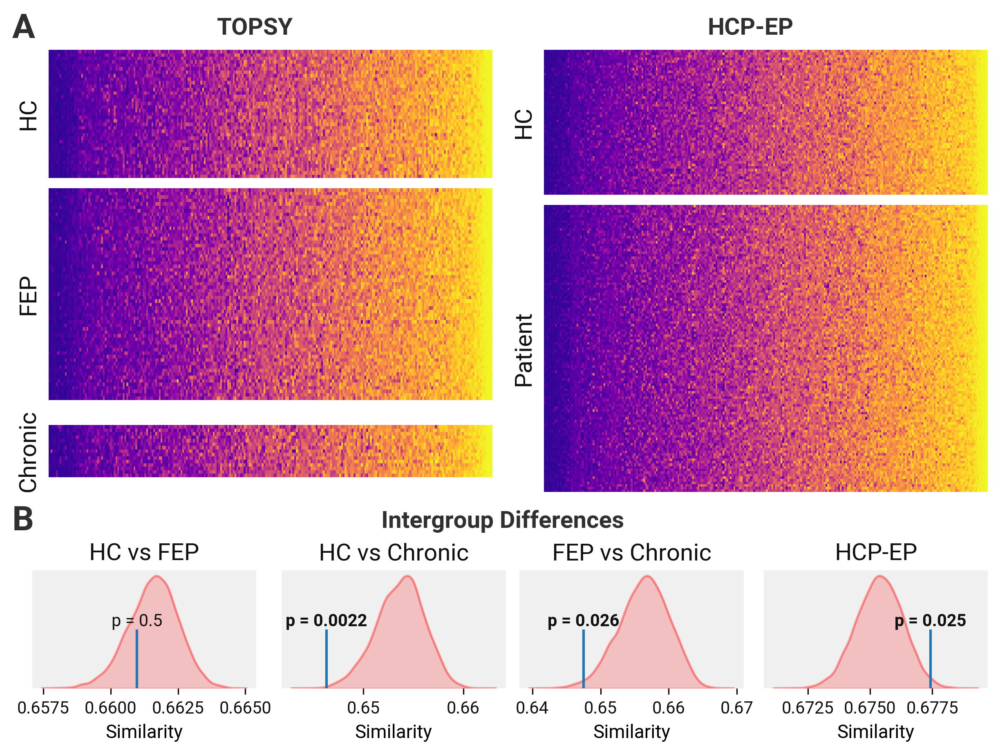

In [44]:
fig = plt.figure(figsize=(8, 6), layout="constrained")
panel_a, panel_b = fig.subfigures(2, 1, height_ratios=[4, 2])

# Panel A
panel_a.text(0, 1, "A", va="top", **Styles.panel_label)
subpanels = panel_a.subfigures(1, 2)
for (dataset, title, order), panel in zip(
    [
        (topsy_hub_data.sel(threshold=0), "TOPSY", ["HC", "FEP", "chronic"]),
        (hcp_hub_data.sortby("group"), "HCP-EP", None),
    ],
    subpanels,
):
    ds = dataset.sel(weight="logsift2")
    if order is None:
        order = np.unique(ds["group"])
    groupby = ds.groupby("group")
    axs = panel.subplots(
        len(groupby.groups),
        1,
        height_ratios=[len(groupby.groups[label]) for label in order],
    )
    for ax, label in zip(axs, order):
        plot_hubness_ranks(
            groupby[label],
            y="subject",
            sort_col="hubness",
            ax=ax,
            sort_by=ds["hubness"].mean("subject"),
            cbar=False,
            # cbar_ax=cbar_ax,
        )
        ax.get_yaxis().set_visible(False)
        ax.text(
            -0.02,
            0.5,
            label[0].capitalize() + label[1:],
            transform=ax.transAxes,
            **Styles.row_title
        )
    panel.suptitle(
        title,
        **Styles.col_title
    )

# Panel B
panel_b.text(0, 1, "B", va="top", **Styles.panel_label)
panel_b.suptitle("Intergroup Differences", **Styles.subfig_title)
axs = panel_b.subplots(1, 4)
for ax, result, title in zip(
    axs,
    [hc_to_fep, hc_to_chronic, fep_to_chronic, hcp_patient_to_hc],
    ("HC vs FEP", "HC vs Chronic", "FEP vs Chronic", "HCP-EP"),
):
    plot_permutation_result(result, ax)
    ax.set_title(title)

## Other parameters Voxelwise

In [17]:
from nilearn import plotting

bkg = topsy.get(
    scope="templategen",
    subject=None,
    suffix="FA",
    extension=".nii.gz",
)[0].path

from bids import BIDSLayout, BIDSLayoutIndexer

# reindex to grab files in sourcedata
stats = BIDSLayout(
    Path(topsy.layout.derivatives["snakemodel"].root),
    indexer=BIDSLayoutIndexer(ignore=[".git", ".snakemake"]),
    validate=False,
    is_derivative=True,
)

md_cmap = "Wistia"
rd_cmap="winter"
ad_cmap="summer"

def get_display(cut_coords):
    return plotting.plot_anat(
        bkg,
        colorbar=False,
        display_mode="z",
        cut_coords=cut_coords,
        # title="FEP vs Chronic",
    )

def to_square(arr):
    return np.vstack([arr[:, :arr.shape[1]//2], arr[:, arr.shape[1]//2:]])

display = get_display(cut_coords=[-20, -0.1])
display.add_overlay(
    stats.get(
        scope="snakemodel",
        subject=None,
        model="tbss",
        desc="md",
        label="chronic2fep",
        suffix="filled",
    )[0].path,
    cmap=md_cmap,
)
display.close()
chronic2fep_md = fig_to_numpy(display.frame_axes.figure)

display = get_display(cut_coords=[-28, -14, 0, 14])
display.add_overlay(
    stats.get(
        scope="snakemodel",
        subject=None,
        model="tbss",
        desc="rd",
        label="chronic2fep",
        suffix="filled",
    )[0].path,
    cmap=rd_cmap,
)
display.close()
chronic2fep_rd = to_square(fig_to_numpy(display.frame_axes.figure))

display = get_display(cut_coords=[-15, -3, 4, 16])
display.add_overlay(
    stats.get(
        scope="snakemodel",
        subject=None,
        model="tbss",
        desc="md",
        label="chronicI",
        suffix="filled",
    )[0].path,
    cmap=md_cmap,
)
display.close()
chronicI_md = fig_to_numpy(display.frame_axes.figure)

display = get_display(cut_coords=[-23, -15, 2, 17])
display.add_overlay(
    stats.get(
        scope="snakemodel",
        subject=None,
        model="tbss",
        desc="rd",
        label="chronicI",
        suffix="filled",
    )[0].path,
    cmap=rd_cmap,
)
display.close()
chronicI_rd = fig_to_numpy(display.frame_axes.figure)

display = get_display(cut_coords=[-9, 0])
display.add_overlay(
    stats.get(
        scope="snakemodel",
        subject=None,
        model="tbss",
        desc="ad",
        label="fepI",
        suffix="filled",
    )[0].path,
    cmap=ad_cmap,
)
display.close()
fepI_ad = fig_to_numpy(display.frame_axes.figure)

display = get_display(cut_coords=[-29, -17, -1, 9])
display.add_overlay(
    stats.get(
        scope="snakemodel",
        subject=None,
        model="tbss",
        desc="md",
        label="fepI",
        suffix="filled",
    )[0].path,
    cmap=md_cmap,
)
display.close()
fepI_md = to_square(fig_to_numpy(display.frame_axes.figure))

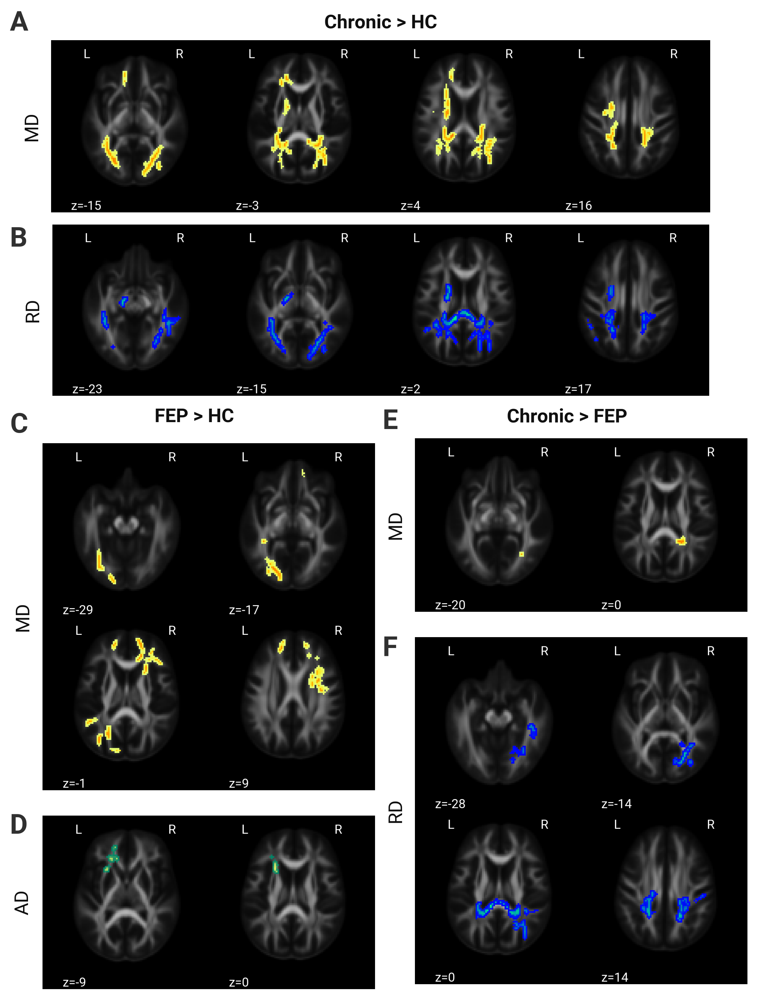

In [76]:
fig = plt.figure(figsize=(7.5, 10), layout="constrained")
grid = fig.add_gridspec(5, 4, height_ratios=[1.15, 1, 1.2, 1, 1.06])

def set_axis(ax, label):
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_tick_params(length=0)
    ax.get_yaxis().set_ticklabels([])
    ax.set_ylabel(label, color="#101010", size=14)

panel_a = fig.add_subfigure(grid[0, :])
panel_a.text(0, 1, "A", va="top", **Styles.panel_label)
panel_a.suptitle("Chronic > HC")
ax = panel_a.add_subplot(111)
ax.imshow(chronicI_md)
set_axis(ax, "MD")

panel_b = fig.add_subfigure(grid[1, :])
panel_b.text(0, 0.97, "B", va="top", **Styles.panel_label)
ax = panel_b.add_subplot(111)
ax.imshow(chronicI_rd)
set_axis(ax, "RD")

panel_c = fig.add_subfigure(grid[2:4, :2])
panel_c.text(0, 0.98, "C", va="top", **Styles.panel_label)
panel_c.suptitle("FEP > HC")
ax = panel_c.add_subplot(111)
ax.imshow(fepI_md)
set_axis(ax, "MD")

panel_d = fig.add_subfigure(grid[4, :2])
panel_d.text(0, 0.97, "D", va="top", **Styles.panel_label)
ax = panel_d.add_subplot(111)
ax.imshow(fepI_ad)
set_axis(ax, "AD")

panel_e = fig.add_subfigure(grid[2, 2:])
panel_e.text(0, 0.98, "E", va="top", **Styles.panel_label)
panel_e.suptitle("Chronic > FEP")
ax = panel_e.add_subplot(111)
ax.imshow(chronic2fep_md)
set_axis(ax, "MD")

panel_f = fig.add_subfigure(grid[3:, 2:])
panel_f.text(0, 0.97, "F", va="top", **Styles.panel_label)
ax = panel_f.add_subplot(111)
ax.imshow(chronic2fep_rd)
set_axis(ax, "RD")

In [64]:
statresults

global-params_ad: $F(2, 110) = 6.02, p = 0.0033$
global-params_ad_hc_chronic: $p = 0.0025$
global-params_md: $F(2, 110) = 9.76, p < 0.001$
global-params_md_fep_chronic: $p = 0.0053$
global-params_md_hc_chronic: $p < 0.001$
global-params_rd: $F(2, 110) = 9.89, p < 0.001$
global-params_rd_fep_chronic: $p = 0.0034$
global-params_rd_hc_chronic: $p < 0.001$
hc-match-chronic_degree: $t(17) = -1.77, p = 0.094$
hc-match-chronic_fa: $t(17) = 2.29, p = 0.035$
hc-match_chronic_degree: $t(50.0) = -2.979130930124532, p = 0.0045$
topology_degree: $F(2, 110) = 4.95, p = 0.0088$
topology_degree_hc_chronic: $p = 0.0093$
topology_intergroup_similarity_fep_chronic: $p = 0.50$
topology_intergroup_similarity_hc_chronic: $p = 0.0022$
topology_intergroup_similarity_hc_ep: $p = 0.025$
topology_intragroup_similarity_fep_chronic: $p = 0.035$
topology_intragroup_similarity_hc_chronic: $p = 0.019$
topology_intragroup_similarity_hc_ep: $p = 0.034$
voxelwise_fa_fep_chronic: $p_{adj} = 0.0504$
voxelwise_fa_hc_chroni